In [1]:
pip install wordcloud

In [2]:
# Gerekli kütüphaneleri yükle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import spacy
import seaborn as sns            
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
# Doğal dil işleme için
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re
from nltk.stem import WordNetLemmatizer
from collections import Counter

# Makine öğrenmesi ve öneri sistemi için
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import OneHotEncoder
 
# Uyarıları gizleyelim
import warnings
warnings.filterwarnings('ignore')

# NLTK veri setlerini indir
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

# Görselleştirme ayarları
plt.style.use('fivethirtyeight')
sns.set_palette('pastel')
nltk.download('averaged_perceptron_tagger')
 


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hero_\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hero_\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\hero_\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\hero_\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\hero_\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [3]:
from transformers import pipeline

In [6]:
pip install pandas numpy matplotlib seaborn plotly wordcloud nltk spacy transformers sentence-transformers gensim torch scikit-learn datasets faiss-cpu pyarrow fastparquet openai umap-learn

Note: you may need to restart the kernel to use updated packages.


In [9]:
pip install pandas numpy matplotlib seaborn plotly wordcloud nltk spacy transformers sentence-transformers gensim torch scikit-learn datasets


Note: you may need to restart the kernel to use updated packages.


In [11]:
#  Veri setlerini oku
steam = pd.read_csv("steam.csv")
steam_desc = pd.read_csv("steam_description_data.csv")
steam_tags = pd.read_csv("steamspy_tag_data.csv")
steam_reqs = pd.read_csv("steam_requirements_data.csv")
steam_media = pd.read_csv("steam_media_data.csv")

#  Gerekli sütunları filtrele
steam = steam[['appid', 'name', 'release_date', 'price', 'positive_ratings', 'negative_ratings', 'owners']]  # Steam
steam_desc = steam_desc[['steam_appid', 'detailed_description', 'about_the_game']]  # Açıklamalar
steam_reqs = steam_reqs[['steam_appid', 'minimum', 'recommended']]  # Gereksinimler
steam_media = steam_media[['steam_appid', 'header_image', 'screenshots', 'movies']]  # Medya bilgisi

# Etiketlerin birleştirilmesi (Tag'lerin birleştirilmesi)
tag_columns = steam_tags.columns[1:]  # 'appid' hariç tüm sütunları al
steam_tags['tags'] = steam_tags[tag_columns].apply(lambda row: ', '.join([col for col in tag_columns if row[col] == 1]), axis=1)
steam_tags = steam_tags[['appid', 'tags']]  # Sadece 'appid' ve 'tags' sütununu al

#  Veri setlerini birleştir
#  Steam ve steam_desc birleştirme
steam_full = pd.merge(steam, steam_desc, left_on='appid', right_on='steam_appid', how='left')

# Steam ve steam_reqs birleştirme (gereksinimler)
steam_full = pd.merge(steam_full, steam_reqs, left_on='appid', right_on='steam_appid', how='left')

# Steam ve steam_media birleştirme (medya bilgileri)
steam_full = pd.merge(steam_full, steam_media, left_on='appid', right_on='steam_appid', how='left')

# Steam ve steam_tags birleştirme (etiket bilgileri)
steam_full = pd.merge(steam_full, steam_tags, on='appid', how='left')

 
 
# Birleştirilmiş veriyi CSV dosyasına kaydet
steam_full.to_csv("data.csv", index=False)  # data.csv dosyası olarak kaydediliyor

print("\nVeri başarıyla 'data.csv' dosyasına kaydedildi.")


Veri başarıyla 'data.csv' dosyasına kaydedildi.


In [12]:
 
# Birleştirilmiş veri setini steam_data.csv olarak kaydedelim
steam_full.to_csv("steam_data.csv", index=False)

# Artık veriyi 'steam_data' değişkeni ile yükleyelim
steam_data = pd.read_csv("steam_data.csv")


In [13]:
steam_data.head()

,appid,name,release_date,price,positive_ratings,negative_ratings,owners,steam_appid_x,detailed_description,about_the_game,steam_appid_y,minimum,recommended,steam_appid,header_image,screenshots,movies,tags
0,10,Counter-Strike,2000-11-01,7.19,124534,3339,10000000-20000000,10,Play the world's number 1 online action game. ...,Play the world's number 1 online action game. ...,10.0,"500 mhz processor, 96mb ram, 16mb video card, ...",NaN,10,https://steamcdn-a.akamaihd.net/steam/apps/10/...,"[{'id': 0, 'path_thumbnail': 'https://steamcdn...",NaN,NaN
1,20,Team Fortress Classic,1999-04-01,3.99,3318,633,5000000-10000000,20,One of the most popular online action games of...,One of the most popular online action games of...,20.0,"500 mhz processor, 96mb ram, 16mb video card, ...",NaN,20,https://steamcdn-a.akamaihd.net/steam/apps/20/...,"[{'id': 0, 'path_thumbnail': 'https://steamcdn...",NaN,NaN
2,30,Day of Defeat,2003-05-01,3.99,3416,398,5000000-10000000,30,Enlist in an intense brand of Axis vs. Allied ...,Enlist in an intense brand of Axis vs. Allied ...,30.0,"500 mhz processor, 96mb ram, 16mb video card, ...",NaN,30,https://steamcdn-a.akamaihd.net/steam/apps/30/...,"[{'id': 0, 'path_thumbnail': 'https://steamcdn...",NaN,NaN
3,40,Deathmatch Classic,2001-06-01,3.99,1273,267,5000000-10000000,40,Enjoy fast-paced multiplayer gaming with Death...,Enjoy fast-paced multiplayer gaming with Death...,40.0,"500 mhz processor, 96mb ram, 16mb video card, ...",NaN,40,https://steamcdn-a.akamaihd.net/steam/apps/40/...,"[{'id': 0, 'path_thumbnail': 'https://steamcdn...",NaN,NaN
4,50,Half-Life: Opposing Force,1999-11-01,3.99,5250,288,5000000-10000000,50,Return to the Black Mesa Research Facility as ...,Return to the Black Mesa Research Facility as ...,50.0,"500 mhz processor, 96mb ram, 16mb video card, ...",NaN,50,https://steamcdn-a.akamaihd.net/steam/apps/50/...,"[{'id': 0, 'path_thumbnail': 'https://steamcdn...",NaN,NaN


In [17]:
steam_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27075 entries, 0 to 27074
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   appid                 27075 non-null  int64  
 1   name                  27075 non-null  object 
 2   release_date          27075 non-null  object 
 3   price                 27075 non-null  float64
 4   positive_ratings      27075 non-null  int64  
 5   negative_ratings      27075 non-null  int64  
 6   owners                27075 non-null  object 
 7   steam_appid_x         27075 non-null  int64  
 8   detailed_description  27075 non-null  object 
 9   about_the_game        27075 non-null  object 
 10  steam_appid_y         27062 non-null  float64
 11  minimum               27057 non-null  object 
 12  recommended           14018 non-null  object 
 13  steam_appid           27075 non-null  int64  
 14  header_image          27075 non-null  object 
 15  screenshots        

In [19]:
steam_data.shape

(27075, 18)

In [21]:
steam_data.columns

Index(['appid', 'name', 'release_date', 'price', 'positive_ratings',
       'negative_ratings', 'owners', 'steam_appid_x', 'detailed_description',
       'about_the_game', 'steam_appid_y', 'minimum', 'recommended',
       'steam_appid', 'header_image', 'screenshots', 'movies', 'tags'],
      dtype='object')

In [23]:
steam_data.tail()

,appid,name,release_date,price,positive_ratings,negative_ratings,owners,steam_appid_x,detailed_description,about_the_game,steam_appid_y,minimum,recommended,steam_appid,header_image,screenshots,movies,tags
27070,1065230,Room of Pandora,2019-04-24,2.09,3,0,0-20000,1065230,"<img src=""https://steamcdn-a.akamaihd.net/stea...","<img src=""https://steamcdn-a.akamaihd.net/stea...",1065230.0,OS: Windows 7 Processor: Inter Core i7 Memory:...,NaN,1065230,https://steamcdn-a.akamaihd.net/steam/apps/106...,"[{'id': 0, 'path_thumbnail': 'https://steamcdn...","[{'id': 256747452, 'name': 'Video', 'thumbnail...",NaN
27071,1065570,Cyber Gun,2019-04-23,1.69,8,1,0-20000,1065570,Have you ever been so lonely that no one but y...,Have you ever been so lonely that no one but y...,1065570.0,"OS: Windows XP, Vista, 7, 8, 10 Processor: Int...",NaN,1065570,https://steamcdn-a.akamaihd.net/steam/apps/106...,"[{'id': 0, 'path_thumbnail': 'https://steamcdn...","[{'id': 256747487, 'name': 'Game Trailer', 'th...",NaN
27072,1065650,Super Star Blast,2019-04-24,3.99,0,1,0-20000,1065650,<strong>Super Star Blast </strong>is a space b...,<strong>Super Star Blast </strong>is a space b...,1065650.0,"OS: Windows 7, Windows 8, Windows 10 (32/64bit...",NaN,1065650,https://steamcdn-a.akamaihd.net/steam/apps/106...,"[{'id': 0, 'path_thumbnail': 'https://steamcdn...","[{'id': 256747530, 'name': 'Gameplay Trailer',...",NaN
27073,1066700,New Yankee 7: Deer Hunters,2019-04-17,5.19,2,0,0-20000,1066700,Pursue a snow-white deer through an enchanted ...,Pursue a snow-white deer through an enchanted ...,1066700.0,OS: Windows XP or later Processor: 1.5 GHz Mem...,OS: Windows 7 or later Processor: 1.5 GHz Memo...,1066700,https://steamcdn-a.akamaihd.net/steam/apps/106...,"[{'id': 0, 'path_thumbnail': 'https://steamcdn...","[{'id': 256747638, 'name': 'Main Trailer', 'th...",NaN
27074,1069460,Rune Lord,2019-04-24,5.19,4,0,0-20000,1069460,A portal has opened and dark magic is pouring ...,A portal has opened and dark magic is pouring ...,1069460.0,OS: Windows XP or later Processor: 2 GHz Memor...,OS: Windows 7 or later Processor: 4 GHZ proces...,1069460,https://steamcdn-a.akamaihd.net/steam/apps/106...,"[{'id': 0, 'path_thumbnail': 'https://steamcdn...","[{'id': 256748098, 'name': 'Main Trailer', 'th...",NaN


In [25]:
steam_data.describe().T

,count,mean,std,min,25%,50%,75%,max
appid,27075.0,596203.508661,250894.167246,10.0,401230.00,599070.00,798760.00,1069460.00
price,27075.0,6.078193,7.874922,0.0,1.69,3.99,7.19,421.99
positive_ratings,27075.0,1000.558523,18988.724439,0.0,6.00,24.00,126.00,2644404.00
negative_ratings,27075.0,211.027147,4284.938531,0.0,2.00,9.00,42.00,487076.00
steam_appid_x,27075.0,596203.508661,250894.167246,10.0,401230.00,599070.00,798760.00,1069460.00
steam_appid_y,27062.0,596323.889846,250810.403492,10.0,401375.00,599120.00,798825.00,1069460.00
steam_appid,27075.0,596203.508661,250894.167246,10.0,401230.00,599070.00,798760.00,1069460.00


In [27]:
steam_data.isnull().sum()

appid                       0
name                        0
release_date                0
price                       0
positive_ratings            0
negative_ratings            0
owners                      0
steam_appid_x               0
detailed_description        0
about_the_game              0
steam_appid_y              13
minimum                    18
recommended             13057
steam_appid                 0
header_image                0
screenshots                 0
movies                   1682
tags                    26557
dtype: int64

In [29]:
# Gereksiz sütunları kaldır
steam_data = steam_data.drop(columns=['steam_appid_x', 'steam_appid_y', 'steam_appid', 'tags'])

# Eksik verileri doldur
steam_data['minimum'] = steam_data['minimum'].fillna('Bilinmiyor')
steam_data['recommended'] = steam_data['recommended'].fillna('Bilinmiyor')
steam_data['movies'] = steam_data['movies'].fillna('[]')

In [31]:
steam_data.isnull().sum()

appid                   0
name                    0
release_date            0
price                   0
positive_ratings        0
negative_ratings        0
owners                  0
detailed_description    0
about_the_game          0
minimum                 0
recommended             0
header_image            0
screenshots             0
movies                  0
dtype: int64

In [33]:
# Gerekli sütunları seç
steam_data = steam_data[['appid', 'name', 'release_date', 'price', 'positive_ratings', 'negative_ratings', 
                         'owners', 'detailed_description', 'about_the_game', 'minimum', 'recommended', 
                         'header_image', 'screenshots', 'movies']]

# Tarih sütununu datetime türüne dönüştür
steam_data['release_date'] = pd.to_datetime(steam_data['release_date'], errors='coerce')

# Owners sütunundaki aralıkları sayıya dönüştür (örneğin, "0-20000" => 20000)
steam_data['owners'] = steam_data['owners'].str.split('-').str[1].astype(float)

# Eksik değerleri doldur
steam_data['recommended'].fillna('No recommendation', inplace=True)  # Eksik değerleri 'No recommendation' ile doldur
steam_data['minimum'].fillna('No information', inplace=True)  # Eksik değerleri 'No information' ile doldur

#  Eksik satırları kaldır
steam_data.dropna(subset=['release_date'], inplace=True)  # Tarih eksikse o satırı kaldır

#  Sütun bilgilerini tekrar kontrol et
print(steam_data.info())

#  Temizlenmiş veri setini kaydet
steam_data.to_csv('steam_data_cleaned.csv', index=False)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27075 entries, 0 to 27074
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   appid                 27075 non-null  int64         
 1   name                  27075 non-null  object        
 2   release_date          27075 non-null  datetime64[ns]
 3   price                 27075 non-null  float64       
 4   positive_ratings      27075 non-null  int64         
 5   negative_ratings      27075 non-null  int64         
 6   owners                27075 non-null  float64       
 7   detailed_description  27075 non-null  object        
 8   about_the_game        27075 non-null  object        
 9   minimum               27075 non-null  object        
 10  recommended           27075 non-null  object        
 11  header_image          27075 non-null  object        
 12  screenshots           27075 non-null  object        
 13  movies          

In [35]:
df=steam_data

In [37]:
steam_data.describe().T

,count,mean,min,25%,50%,75%,max,std
appid,27075.0,596203.508661,10.0,401230.0,599070.0,798760.0,1069460.0,250894.167246
release_date,27075,2016-12-31 14:21:17.252077568,1997-06-30 00:00:00,2016-04-04 00:00:00,2017-08-08 00:00:00,2018-06-06 12:00:00,2019-05-01 00:00:00,NaN
price,27075.0,6.078193,0.0,1.69,3.99,7.19,421.99,7.874922
positive_ratings,27075.0,1000.558523,0.0,6.0,24.0,126.0,2644404.0,18988.724439
negative_ratings,27075.0,211.027147,0.0,2.0,9.0,42.0,487076.0,4284.938531
owners,27075.0,188054.293629,20000.0,20000.0,20000.0,50000.0,200000000.0,1786800.655351


In [80]:
# Owners sütunundaki NaN değerlerini medyan ile dolduralım
df['owners'].fillna(df['owners'].median(), inplace=True)

In [78]:
# 1) NaN değerleri medyan ile doldur
df['owners'].fillna(df['owners'].median(), inplace=True)

# 2) Negatif değerleri sıfıra çek
df['owners'] = df['owners'].clip(lower=0)

# 3) Log + IQR Winsorize ile uç değerleri düzelt
log_iqr_winsorize(df, 'owners', factor=3)

# 4) Veriyi incele
df.describe().T


,count,mean,min,25%,50%,75%,max,std
appid,27075.0,596203.508661,10.0,401230.0,599070.0,798760.0,1069460.0,250894.167246
release_date,27075,2016-12-31 14:21:17.252077568,1997-06-30 00:00:00,2016-04-04 00:00:00,2017-08-08 00:00:00,2018-06-06 12:00:00,2019-05-01 00:00:00,NaN
price,27075.0,6.078193,0.0,1.69,3.99,7.19,421.99,7.874922
positive_ratings,27075.0,1000.558523,0.0,6.0,24.0,126.0,2644404.0,18988.724439
negative_ratings,27075.0,211.027147,0.0,2.0,9.0,42.0,487076.0,4284.938531
owners,27075.0,90160.824965,20000.0,20000.0,20000.0,50000.0,781194.316718,175778.663751
release_year,27075.0,2016.498098,1997.0,2016.0,2017.0,2018.0,2019.0,2.15699


In [ ]:
def log_iqr_winsorize(df, col, factor=1.5):
    """
    Log dönüşümü ile outlier'ları normalize eder,
    ardından IQR ile alt/üst sınırlara kırpar ve eski ölçeğe döndürür.
    """
    # Negatif değerleri sıfıra çek
    df[col] = df[col].clip(lower=0)
    # Log dönüşümü
    log_data = np.log1p(df[col])  # log1p dönüşümü (log(x+1))
    # IQR hesaplama
    Q1 = np.percentile(log_data, 25)
    Q3 = np.percentile(log_data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    # Uç değerleri kırp
    log_data_clipped = np.clip(log_data, lower_bound, upper_bound)
    # Orijinal ölçeğe geri dönüş
    df[col] = np.expm1(log_data_clipped)


In [84]:
# IQR Winsorize Fonksiyonu
def iqr_winsorize(df, col, factor=1.5):
    """
    IQR yöntemi ile alt ve üst sınırları belirler ve outlier değerleri sınırlarla değiştirir.
    """
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    df[col] = df[col].apply(lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))

#  Log + IQR Winsorize Fonksiyonu
def log_iqr_winsorize(df, col, factor=1.5):
    """
    Log dönüşümü ile outlier'ları normalize eder, ardından IQR yöntemiyle kırpar ve eski ölçeğe döner.
    """
    df[col] = df[col].clip(lower=0)  # Negatif değerleri sıfıra çek
    log_data = np.log1p(df[col])  # log(x+1) dönüşümü
    Q1 = np.percentile(log_data, 25)
    Q3 = np.percentile(log_data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    log_clipped = np.clip(log_data, lower_bound, upper_bound)
    df[col] = np.expm1(log_clipped)  # Orijinal ölçeğe döner

#  Anormallikleri Düzeltme
# Price için IQR Winsorize
iqr_winsorize(steam_data, 'price')

# Positive ve Negative Ratings için Log + IQR Winsorize
log_iqr_winsorize(steam_data, 'positive_ratings')
log_iqr_winsorize(steam_data, 'negative_ratings')

# Owners için Log + IQR Winsorize
log_iqr_winsorize(steam_data, 'owners', factor=3)

#  Sonuçları Kontrol Et
steam_data.describe().T

,count,mean,min,25%,50%,75%,max,std
appid,27075.0,596203.508661,10.0,401230.0,599070.0,798760.0,1069460.0,250894.167246
release_date,27075,2016-12-31 14:21:17.252077568,1997-06-30 00:00:00,2016-04-04 00:00:00,2017-08-08 00:00:00,2018-06-06 12:00:00,2019-05-01 00:00:00,NaN
price,27075.0,5.417743,0.0,1.69,3.99,7.19,15.44,4.641975
positive_ratings,27075.0,434.097407,0.0,6.0,24.0,126.0,9813.365833,1504.481287
negative_ratings,27075.0,102.154708,0.0,2.0,9.0,42.0,2332.40034,335.110789
owners,27075.0,90160.824965,20000.0,20000.0,20000.0,50000.0,781194.316718,175778.663751
release_year,27075.0,2016.498098,1997.0,2016.0,2017.0,2018.0,2019.0,2.15699


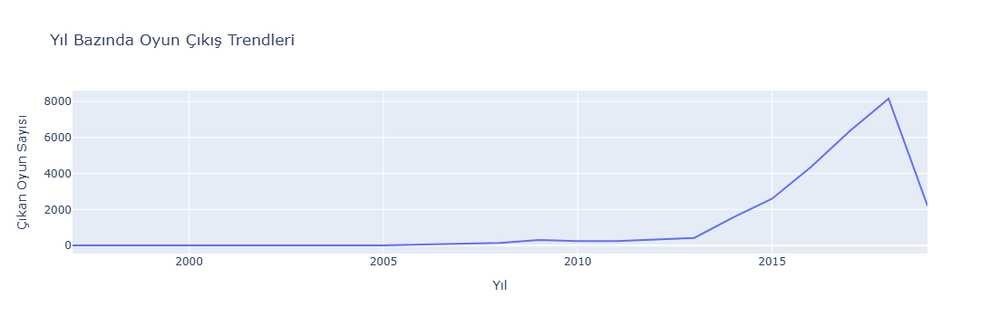

In [42]:
#  Yıl bilgisini ekleyelim
steam_data['release_year'] = pd.to_datetime(steam_data['release_date']).dt.year

#  Yıl bazında oyun sayısını hesaplayalım
yearly_game_count = steam_data['release_year'].value_counts().sort_index()

#  Görselleştirme
import plotly.express as px

fig = px.line(x=yearly_game_count.index, 
              y=yearly_game_count.values, 
              labels={'x': 'Yıl', 'y': 'Çıkan Oyun Sayısı'}, 
              title='Yıl Bazında Oyun Çıkış Trendleri')

# Grafiği göster
fig.show()

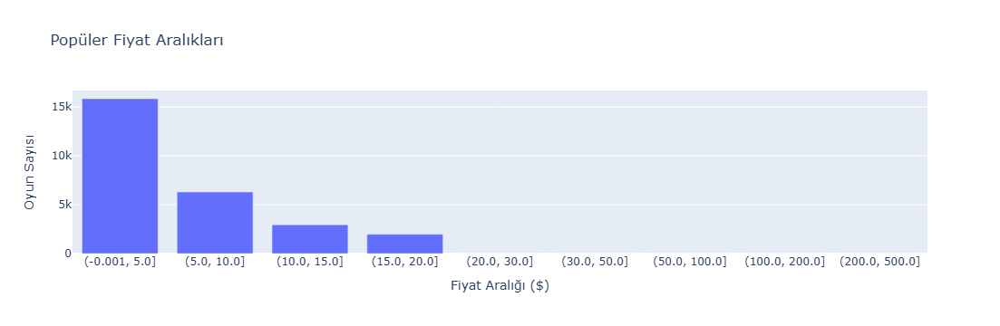

In [86]:
#  Fiyat aralıklarını belirleyelim
price_bins = [0, 5, 10, 15, 20, 30, 50, 100, 200, 500]  # Fiyat aralıkları
steam_data['price_bin'] = pd.cut(steam_data['price'], bins=price_bins, include_lowest=True)

#  Frekans dağılımını hesaplayalım
price_bin_counts = steam_data['price_bin'].value_counts().sort_index()

# Görselleştirme


fig = px.bar(x=price_bin_counts.index.astype(str), 
             y=price_bin_counts.values, 
             labels={'x': 'Fiyat Aralığı ($)', 'y': 'Oyun Sayısı'}, 
             title='Popüler Fiyat Aralıkları')

# Grafiği göster
fig.show()

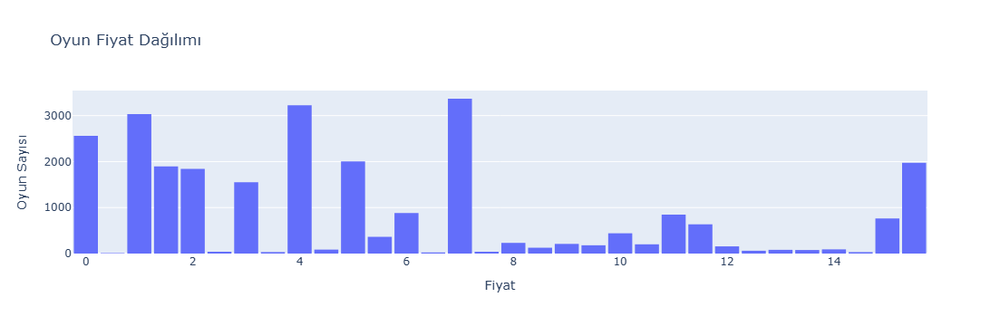

In [88]:

# Fiyat dağılımını inceleyelim
fig = px.histogram(steam_data, x='price', nbins=50, title='Oyun Fiyat Dağılımı')
fig.update_layout(xaxis_title='Fiyat', yaxis_title='Oyun Sayısı', bargap=0.1)
fig.show()

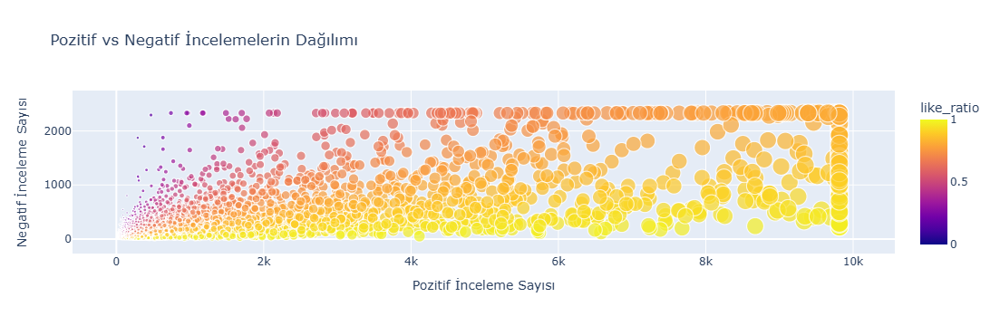

In [90]:
import plotly.express as px

# like_ratio sütununu hesapla
steam_data['like_ratio'] = steam_data['positive_ratings'] / (
    steam_data['positive_ratings'] + steam_data['negative_ratings']
)

# Scatter plot oluştur
fig = px.scatter(
    steam_data, 
    x='positive_ratings', 
    y='negative_ratings', 
    color='like_ratio', 
    size='positive_ratings', 
    hover_name='name', 
    title='Pozitif vs Negatif İncelemelerin Dağılımı'
)

# Ekseni düzenle
fig.update_layout(
    xaxis_title='Pozitif İnceleme Sayısı', 
    yaxis_title='Negatif İnceleme Sayısı'
)

# Grafiği göster
fig.show()


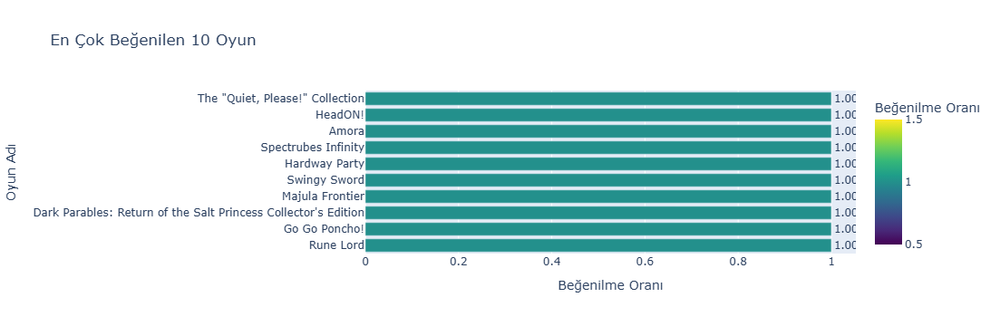

In [91]:
# En çok beğenilen ilk 10 oyunu al
most_liked_games = steam_data.sort_values(by='like_ratio', ascending=False).head(10)

# Boş isimler varsa dolduralım
most_liked_games['name'].fillna('Bilinmeyen Oyun', inplace=True)

# En çok beğenilen 10 oyunun görselleştirilmesi (Bar Chart)
fig = px.bar(most_liked_games, 
             x='like_ratio', 
             y='name', 
             orientation='h',  # Yatay barlar
             color='like_ratio', 
             text='like_ratio', 
             title='En Çok Beğenilen 10 Oyun',
             labels={'like_ratio': 'Beğenilme Oranı', 'name': 'Oyun Adı'},
             color_continuous_scale='Viridis'
            )

# Görselleştirme için tasarım ayarları
fig.update_layout(
    xaxis_title='Beğenilme Oranı',
    yaxis_title='Oyun Adı',
    coloraxis_showscale=True,
    showlegend=False
)

# Beğenilme oranını yuvarlayarak metin olarak gösterelim
fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')

# Grafiği göster
fig.show()

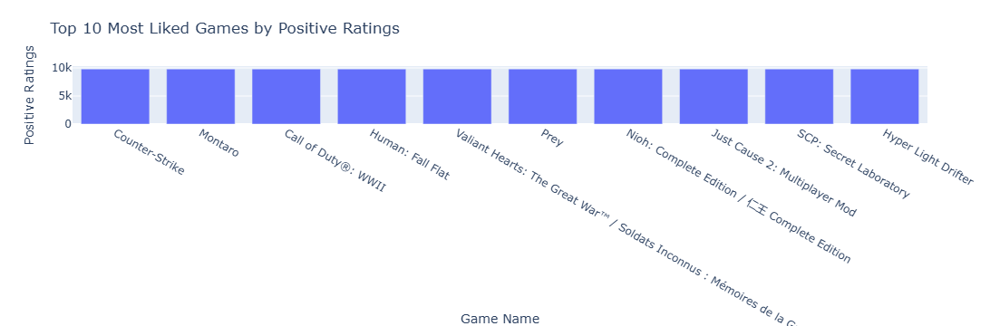

In [96]:
# En çok beğenilen ilk 10 oyunu belirle
top_10_positive_ratings = steam_data.sort_values(by='positive_ratings', ascending=False).head(10)

# Plotly ile görselleştirme
fig = px.bar(
    top_10_positive_ratings,
    x='name',  # Oyun adını x eksenine al
    y='positive_ratings',  # Pozitif değerlendirme sayısını y eksenine al
    text='positive_ratings',  # Çubukların üzerine pozitif değerlendirme sayısını ekle
    labels={'name': 'Game Name', 'positive_ratings': 'Positive Ratings'},
    title='Top 10 Most Liked Games by Positive Ratings'
)

# Çubukların üzerine metin ekle ve grafiği göster
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(xaxis=dict(tickmode='linear', title="Game Name"), yaxis=dict(title="Positive Ratings"))
fig.show()

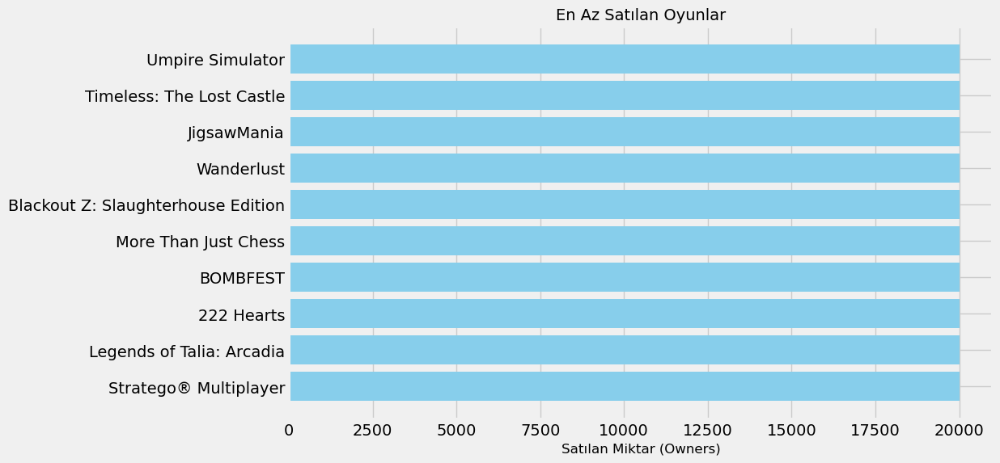

In [98]:
# "owners" sütununa göre en az satılan oyunları bulalım (NaN değerler hariç)
least_sold_games = steam_data[['name', 'owners']].dropna()  # NaN değerleri çıkarıyoruz
least_sold_games['owners'] = least_sold_games['owners'].astype(int)  # 'owners' sütununu int türüne dönüştür

# En az satılan oyunları 10 en düşükten başlayarak sıralayalım
least_sold_games = least_sold_games.sort_values(by='owners', ascending=True).head(10)

# Grafik için görselleştirelim
plt.figure(figsize=(10, 6))
plt.barh(least_sold_games['name'], least_sold_games['owners'], color='skyblue')
plt.xlabel('Satılan Miktar (Owners)', fontsize=12)
plt.title('En Az Satılan Oyunlar', fontsize=14)
plt.gca().invert_yaxis()  # Y eksenini ters çevirerek en az satılan oyunları üstte göstermek
plt.show()


In [159]:
# Negatif tahminleri sıfıra çek
y_pred = np.maximum(y_pred, 0)

# Güncellenmiş tahminleri değerlendirme
comparison = pd.DataFrame({'Actual Price': y_test, 'Predicted Price': y_pred}).reset_index(drop=True)
print(comparison.head())


   Actual Price  Predicted Price
0             0         0.668533
1             0         0.000518
2             1         0.725514
3             1         0.878359
4             0         0.348747


In [102]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Bağımsız değişkenler ve hedef değişken
X = steam_data[['price', 'negative_ratings', 'release_date']]  # Örnek olarak bazı özellikler
y = steam_data['positive_ratings']

# Çıkış yılını ayırarak özellik mühendisliği yapalım
X['release_year'] = pd.to_datetime(X['release_date']).dt.year
X = X.drop(columns=['release_date'])


In [104]:
# Veriyi eğitim ve test setine ayır
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [110]:
# Random Forest Regressor modeli
model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)


RandomForestRegressor(random_state=42)

In [112]:
# Tahmin yap
y_pred = model.predict(X_test)

# Modelin performansını ölç
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 703347.6413597313
R^2 Score: 0.698807124667332


In [114]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [116]:
 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV

#  Özellik Mühendisliği
# Oyun yılı ve log fiyatı ekleyelim
steam_data['release_year'] = pd.to_datetime(steam_data['release_date']).dt.year
steam_data['log_price'] = np.log1p(steam_data['price'])

# Bağımsız değişkenler ve hedef değişkeni belirleyelim
X = steam_data[['log_price', 'negative_ratings', 'release_year']]  # Özellikler
y = steam_data['positive_ratings']  # Hedef değişken

#  Veriyi eğitim ve test setine bölelim
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#  Özellik Ölçekleme (StandardScaler)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#  Model Seçimi ve Hiperparametre Optimizasyonu
model = XGBRegressor(random_state=42)

# Hiperparametreler için GridSearch
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
}

grid_search = GridSearchCV(model, param_grid, cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train)

# En iyi parametreleri al
print(f"Best parameters: {grid_search.best_params_}")

# En iyi model ile tahmin yap
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_scaled)

# Performans ölçümleri
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")


Fitting 3 folds for each of 18 candidates, totalling 54 fits
Best parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Mean Squared Error: 595276.4636118654
R^2 Score: 0.7450861861902234


In [118]:
# owners sütununun türünü kontrol et ve string'e dönüştür
if 'owners' in steam_data.columns:
    if not pd.api.types.is_string_dtype(steam_data['owners']):
        steam_data['owners'] = steam_data['owners'].astype(str)

    # Alt sınırı çıkar ve owners_lower sütununu oluştur
    steam_data['owners_lower'] = steam_data['owners'].str.split('-').str[0].astype(float)
else:
    print("owners sütunu bulunamadı!")


In [120]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Popülerlik Skorunu Hesapla
steam_data['popularity_score'] = steam_data['positive_ratings'] / (
    steam_data['positive_ratings'] + steam_data['negative_ratings']
)

# Bağımsız ve bağımlı değişkenler
X = steam_data[['positive_ratings', 'negative_ratings', 'owners_lower']]  # Bağımsız değişkenler
y = steam_data['popularity_score']  # Hedef değişken

# Veri setini eğitim ve test olarak ayır
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Lineer regresyon modeli oluştur ve eğit
model = LinearRegression()
model.fit(X_train, y_train)

# Tahmin yap
y_pred = model.predict(X_test)

# Performansı değerlendir
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print("Model Performansı:")
print(f"R² Score: {r2:.2f}")
print(f"Mean Squared Error: {mse:.2f}")

# Gerçek ve tahmin edilen değerleri karşılaştır
comparison = pd.DataFrame({'Actual Score': y_test, 'Predicted Score': y_pred}).reset_index(drop=True)
print("İlk 10 Tahmin Sonucu:")
print(comparison.head(10))


Model Performansı:
R² Score: 0.05
Mean Squared Error: 0.05
İlk 10 Tahmin Sonucu:
   Actual Score  Predicted Score
0      0.666667         0.708720
1      0.000000         0.708813
2      0.727273         0.703454
3      0.874879         0.745894
4      0.352941         0.706704
5      1.000000         0.709133
6      0.944444         0.710889
7      0.917526         0.717220
8      0.593939         0.689187
9      0.967742         0.710867


In [122]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Popülerlik Skorunu Hesapla
steam_data['popularity_score'] = steam_data['positive_ratings'] / (
    steam_data['positive_ratings'] + steam_data['negative_ratings']
)

# Logaritmik dönüşüm: Pozitif ve negatif incelemelerde uç değerleri yumuşatmak için
steam_data['log_positive'] = np.log1p(steam_data['positive_ratings'])
steam_data['log_negative'] = np.log1p(steam_data['negative_ratings'])

# Bağımsız ve bağımlı değişkenler
X = steam_data[['log_positive', 'log_negative', 'owners_lower', 'price']]
y = steam_data['popularity_score']

# Veri setini eğitim ve test olarak ayır
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# XGBoost Regressor Modeli
model = XGBRegressor(
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    random_state=42
)
model.fit(X_train, y_train)

# Tahmin yap
y_pred = model.predict(X_test)

# Performansı değerlendir
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print("Model Performansı (XGBoost):")
print(f"R² Score: {r2:.2f}")
print(f"Mean Squared Error: {mse:.2f}")

# İlk 10 tahmin sonucu
comparison = pd.DataFrame({'Actual Score': y_test, 'Predicted Score': y_pred}).reset_index(drop=True)
print("İlk 10 Tahmin Sonucu:")
print(comparison.head(10))


Model Performansı (XGBoost):
R² Score: 1.00
Mean Squared Error: 0.00
İlk 10 Tahmin Sonucu:
   Actual Score  Predicted Score
0      0.666667         0.668533
1      0.000000         0.000518
2      0.727273         0.725514
3      0.874879         0.878359
4      0.352941         0.348747
5      1.000000         0.999806
6      0.944444         0.938534
7      0.917526         0.911940
8      0.593939         0.597101
9      0.967742         0.967942


In [124]:
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

# Popülerlik Skorunu Sınıflandır
threshold = 0.7  # Eşik değeri
steam_data['is_popular'] = (steam_data['popularity_score'] > threshold).astype(int)

# Bağımsız ve bağımlı değişkenler
X = steam_data[['positive_ratings', 'negative_ratings', 'owners_lower']]
y = steam_data['is_popular']

# Eğitim ve test veri seti
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Lineer Regresyon Modeli
lin_model = LinearRegression()
lin_model.fit(X_train, y_train)

# XGBoost Modeli
xgb_model = XGBRegressor(n_estimators=100, max_depth=6, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

# Tahminler
lin_pred = lin_model.predict(X_test)
xgb_pred = xgb_model.predict(X_test)

# Sınıflandırma (Eşik Değerine Göre Tahminleri Dönüştürme)
lin_pred_class = (lin_pred > threshold).astype(int)
xgb_pred_class = (xgb_pred > threshold).astype(int)

# Performans Metrikleri Hesaplama
def evaluate_model(y_test, y_pred_class, model_name):
    # Confusion Matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    TN, FP, FN, TP = conf_matrix.ravel()

    # Metrikler
    accuracy = accuracy_score(y_test, y_pred_class)
    precision = precision_score(y_test, y_pred_class)
    recall = recall_score(y_test, y_pred_class)
    f1 = f1_score(y_test, y_pred_class)

    # Sonuçları Yazdır
    print(f"Model: {model_name}")
    print("Confusion Matrix:")
    print(conf_matrix)
    print(f"True Positive (TP): {TP}")
    print(f"False Positive (FP): {FP}")
    print(f"True Negative (TN): {TN}")
    print(f"False Negative (FN): {FN}")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 Score: {f1:.2f}")
    print("\n")

# Lineer Regresyon Performansı
evaluate_model(y_test, lin_pred_class, "Linear Regression")

# XGBoost Performansı
evaluate_model(y_test, xgb_pred_class, "XGBoost")

Model: Linear Regression
Confusion Matrix:
[[2133    0]
 [2986  296]]
True Positive (TP): 296
False Positive (FP): 0
True Negative (TN): 2133
False Negative (FN): 2986
Accuracy: 0.45
Precision: 1.00
Recall: 0.09
F1 Score: 0.17


Model: XGBoost
Confusion Matrix:
[[2131    2]
 [ 115 3167]]
True Positive (TP): 3167
False Positive (FP): 2
True Negative (TN): 2131
False Negative (FN): 115
Accuracy: 0.98
Precision: 1.00
Recall: 0.96
F1 Score: 0.98




In [126]:
import re
from sklearn.feature_extraction.text import CountVectorizer

# HTML etiketlerini temizleme fonksiyonu
def clean_html(text):
    clean_text = re.sub(r'<.*?>', '', text)  # HTML etiketlerini kaldır
    return clean_text

# Oyun açıklamalarındaki metinleri temizleyelim
clean_descriptions = steam_data['detailed_description'].fillna('') + " " + steam_data['about_the_game'].fillna('')
clean_descriptions = clean_descriptions.apply(clean_html)

# Temizlenmiş açıklamalardan en sık geçen kelimeleri tekrar analiz edelim
vectorizer = CountVectorizer(stop_words='english', max_features=10)
X = vectorizer.fit_transform(clean_descriptions)

# En sık geçen kelimeleri yazdıralım
words = vectorizer.get_feature_names_out()
frequencies = X.sum(axis=0).A1  # Kelimelerin sıklığını al

# Sonuçları bir DataFrame'e çevirelim
word_freq = pd.DataFrame({'word': words, 'frequency': frequencies})
word_freq = word_freq.sort_values(by='frequency', ascending=False)

print(word_freq.head(10))  # En sık geçen 10 kelimeyi göster


        word  frequency
2       game     112426
3        new      42895
9      world      40057
7       quot      39824
4       play      33972
8       time      30039
0  different      26421
1   features      25045
6    players      23669
5     player      22888


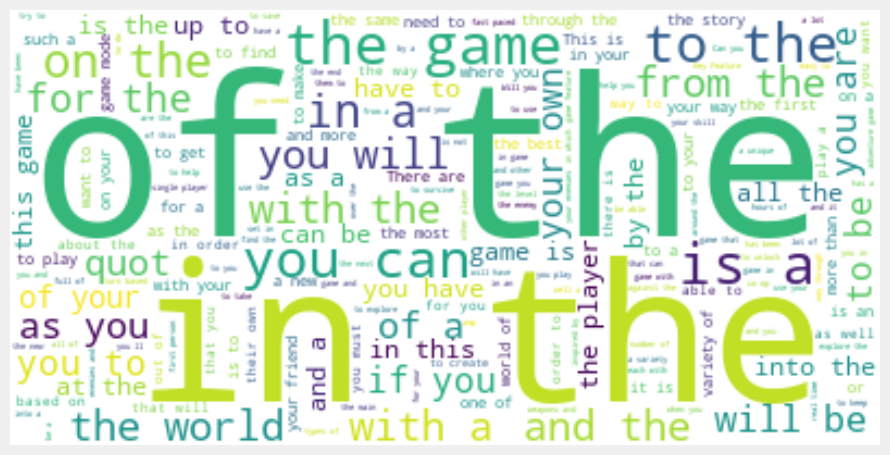

In [128]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Temizlenmiş metinleri birleştirelim
text = ' '.join(clean_descriptions)

# Kelime bulutunu oluştur
wordcloud = WordCloud(stopwords='english', background_color='white').generate(text)

# Kelime bulutunu görselleştir
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [129]:
pip install vaderSentiment

Note: you may need to restart the kernel to use updated packages.


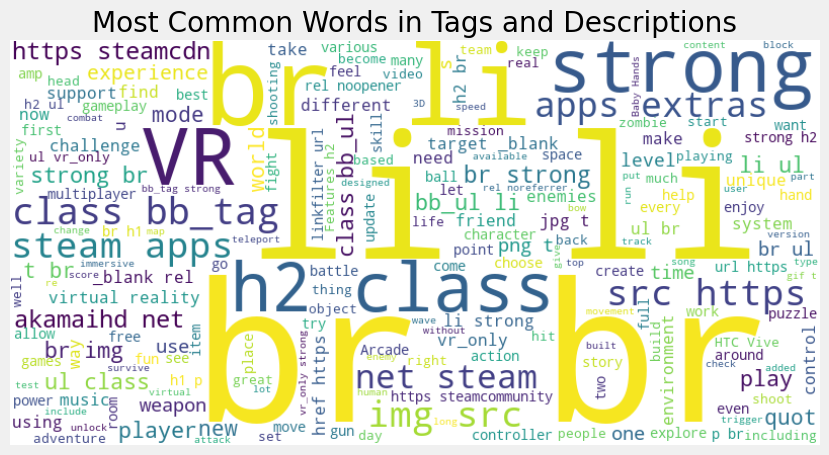

In [144]:
# 1. Tags ve Description Analizi
# Tags ve açıklama kolonlarını birleştiriyoruz
steam_data['text_data'] = steam_data['tags'] + " " + steam_data['detailed_description'].fillna("")

# 2. Kelime Bulutu Görselleştirme
text = " ".join(steam_data['text_data'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)

# Görselleştirme
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Most Common Words in Tags and Descriptions")
plt.show()


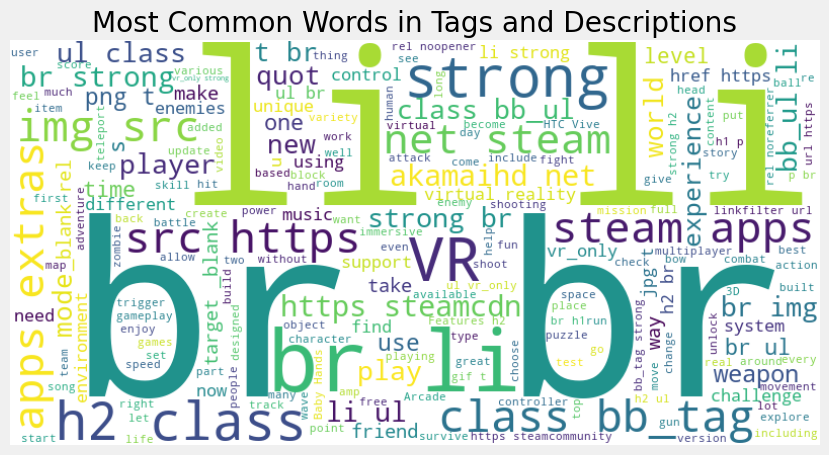

In [143]:
# Veri setini yükleme
steam_data = pd.read_csv("steam_data.csv")

# 1. Tags ve Description Analizi
# Tags ve açıklama kolonlarını birleştiriyoruz
steam_data['text_data'] = steam_data['tags'] + " " + steam_data['detailed_description'].fillna("")

# 2. Kelime Bulutu Görselleştirme
text = " ".join(steam_data['text_data'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)

# Görselleştirme
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Most Common Words in Tags and Descriptions")
plt.show()


In [135]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# VADER Sentiment Analyzer başlat
analyzer = SentimentIntensityAnalyzer()

# Oyun açıklamalarını alalım (detailed_description ve about_the_game)
descriptions = steam_data['detailed_description'].fillna('') + " " + steam_data['about_the_game'].fillna('')

# Yorumlardaki duygu analizini yapalım
sentiments = descriptions.apply(lambda x: analyzer.polarity_scores(x))

# Duygu skorlarına göre pozitif, negatif ve nötr yorumları ayıralım
sentiments_df = pd.DataFrame(sentiments.tolist())
sentiments_df['description'] = descriptions

# Sonuçları görüntüleyelim
print(sentiments_df.head())

# Pozitif ve negatif açıklamaları sayalım
positive_descriptions = sentiments_df[sentiments_df['compound'] > 0].shape[0]
negative_descriptions = sentiments_df[sentiments_df['compound'] < 0].shape[0]
neutral_descriptions = sentiments_df[sentiments_df['compound'] == 0].shape[0]

print(f"Pozitif açıklamalar: {positive_descriptions}")
print(f"Negatif açıklamalar: {negative_descriptions}")
print(f"Nötr açıklamalar: {neutral_descriptions}")

     neg    neu    pos  compound  \
0  0.153  0.559  0.288    0.9371   
1  0.079  0.805  0.116    0.5840   
2  0.122  0.822  0.056   -0.8910   
3  0.000  0.920  0.080    0.7506   
4  0.037  0.911  0.052    0.3818   

                                         description  
0  Play the world's number 1 online action game. ...  
1  One of the most popular online action games of...  
2  Enlist in an intense brand of Axis vs. Allied ...  
3  Enjoy fast-paced multiplayer gaming with Death...  
4  Return to the Black Mesa Research Facility as ...  
Pozitif açıklamalar: 18419
Negatif açıklamalar: 8355
Nötr açıklamalar: 301


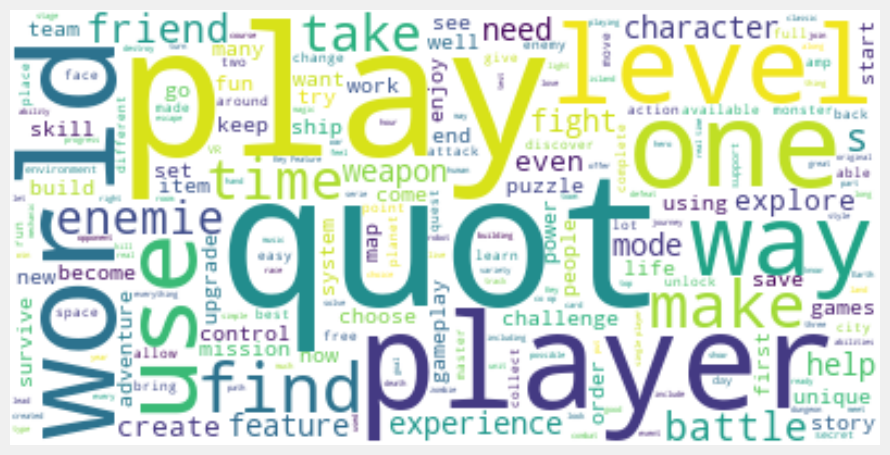

In [136]:
from wordcloud import STOPWORDS

# Stop kelimeleri belirleyelim
stopwords = STOPWORDS
additional_stopwords = {"game", "the", "is", "on", "to", "be", "from", "you", "will"}
stopwords.update(additional_stopwords)

# HTML etiketlerini kaldırma fonksiyonu
import re

def clean_html(text):
    clean_text = re.sub(r'<.*?>', '', text)  # HTML etiketlerini kaldır
    return clean_text

# Temizlenmiş açıklamalardan kelime bulutu oluşturma
clean_descriptions = steam_data['detailed_description'].fillna('') + " " + steam_data['about_the_game'].fillna('')
clean_descriptions = clean_descriptions.apply(clean_html)

# Kelime bulutunu oluştur
text = ' '.join(clean_descriptions)
wordcloud = WordCloud(stopwords=stopwords, background_color='white').generate(text)

# Kelime bulutunu görselleştir
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

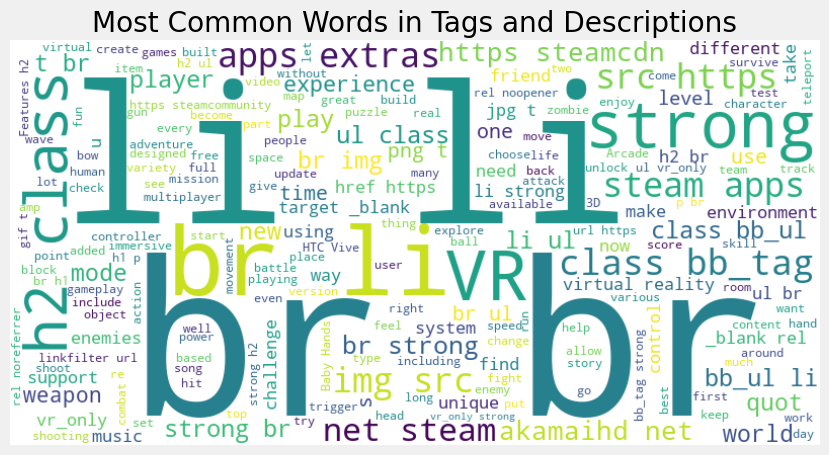

In [137]:
# 1. Tags ve Description Analizi
# Tags ve açıklama kolonlarını birleştiriyoruz
steam_data['text_data'] = steam_data['tags'] + " " + steam_data['detailed_description'].fillna("")

# 2. Kelime Bulutu Görselleştirme
text = " ".join(steam_data['text_data'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)

# Görselleştirme
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Most Common Words in Tags and Descriptions")
plt.show()


In [138]:
from transformers import pipeline

# Duygu analizi pipeline
sentiment_analyzer = pipeline('sentiment-analysis', model="distilbert-base-uncased-finetuned-sst-2-english")

# Temizlenmiş açıklamalar
sample_texts = steam_data['detailed_description'].head(5).fillna('').tolist()
sentiments = sentiment_analyzer(sample_texts)

# Sonuçları göster
for text, sentiment in zip(sample_texts, sentiments):
    print(f"Text: {text[:100]}...")
    print(f"Sentiment: {sentiment}\n")

Device set to use cpu


Text: Play the world's number 1 online action game. Engage in an incredibly realistic brand of terrorist w...
Sentiment: {'label': 'POSITIVE', 'score': 0.9993355870246887}

Text: One of the most popular online action games of all time, Team Fortress Classic features over nine ch...
Sentiment: {'label': 'POSITIVE', 'score': 0.9995385408401489}

Text: Enlist in an intense brand of Axis vs. Allied teamplay set in the WWII European Theatre of Operation...
Sentiment: {'label': 'POSITIVE', 'score': 0.997323215007782}

Text: Enjoy fast-paced multiplayer gaming with Deathmatch Classic (a.k.a. DMC). Valve's tribute to the wor...
Sentiment: {'label': 'POSITIVE', 'score': 0.9995824694633484}

Text: Return to the Black Mesa Research Facility as one of the military specialists assigned to eliminate ...
Sentiment: {'label': 'POSITIVE', 'score': 0.9988620281219482}



In [139]:
summarizer = pipeline("summarization", model="google/pegasus-xsum")

# Özetleme
sample_text = steam_data['detailed_description'].iloc[0]
summary = summarizer(sample_text, max_length=50, min_length=10, do_sample=False)

print("Original Text:", sample_text)
print("Summary:", summary[0]['summary_text'])


Some weights of PegasusForConditionalGeneration were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight', 'model.encoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Device set to use cpu


Original Text: Play the world's number 1 online action game. Engage in an incredibly realistic brand of terrorist warfare in this wildly popular team-based game. Ally with teammates to complete strategic missions. Take out enemy sites. Rescue hostages. Your role affects your team's success. Your team's success affects your role.
Summary: World of Warcraft is the world's most popular massively multiplayer online game.


In [157]:
from sentence_transformers import SentenceTransformer, util

# Model yükle
model = SentenceTransformer('all-MiniLM-L6-v2')

# Açıklamaları embed et
descriptions = steam_data['detailed_description'].fillna('').tolist()
embeddings = model.encode(descriptions, convert_to_tensor=True)

# Kullanıcı isteği
user_query = "I want a multiplayer game with realistic graphics"
query_embedding = model.encode(user_query, convert_to_tensor=True)

# Benzerlik skoru hesapla
cosine_scores = util.pytorch_cos_sim(query_embedding, embeddings)

# En iyi eşleşmeleri seç
top_matches = cosine_scores.topk(5).indices.tolist()

# Önerileri göster
print("Top Game Recommendations:")
for idx in top_matches[0]:
    print(steam_data.iloc[idx]['name'])


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Top Game Recommendations:
Cardboard Wars
Requiem
Drunken Fight Simulator
Uebergame
Realshot


In [158]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

# Açıklamaları vektörize et
vectorizer = CountVectorizer(stop_words='english', max_features=1000)
X = vectorizer.fit_transform(clean_descriptions)

# LDA ile tema analizi
lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda.fit(X)

# Temaları yazdır
for idx, topic in enumerate(lda.components_):
    print(f"Topic #{idx}:")
    print([vectorizer.get_feature_names_out()[i] for i in topic.argsort()[-10:]])


Topic #0:
['experience', 'make', 'just', 'like', 'games', 'time', 'play', 'vr', 'quot', 'game']
Topic #1:
['new', 'music', 'different', 'puzzles', 'play', 'features', 'puzzle', 'level', 'levels', 'game']
Topic #2:
['experience', 'features', 'unique', 'explore', 'characters', 'adventure', 'game', 'new', 'story', 'world']
Topic #3:
['different', 'enemies', 'multiplayer', 'battle', 'play', 'player', 'mode', 'new', 'players', 'game']
Topic #4:
['way', 'make', 'weapons', 'different', 'time', 'build', 'enemies', 'new', 'game', 'world']


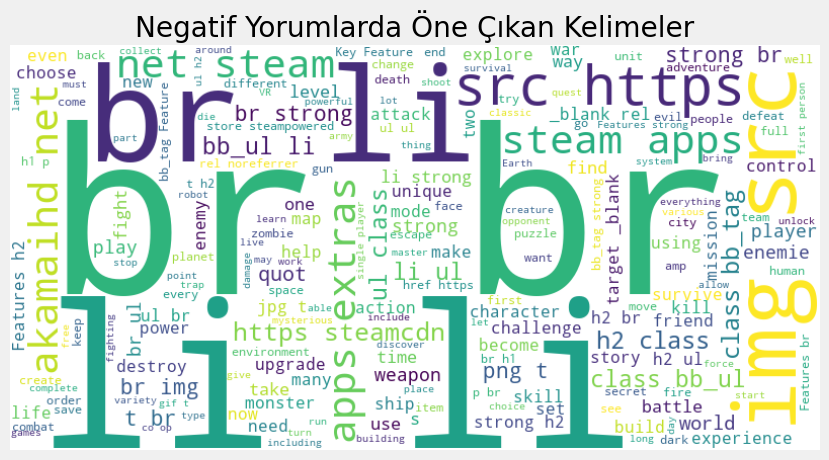

In [164]:
# Negatif açıklamaları filtrele
negative_reviews = steam_data[sentiments_df['compound'] < 0]

# En sık geçen kelimeleri analiz et (WordCloud)
from wordcloud import WordCloud

negative_text = " ".join(negative_reviews['detailed_description'].fillna(''))
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(negative_text)

# Görselleştir
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Negatif Yorumlarda Öne Çıkan Kelimeler')
plt.show()


In [167]:
# like_ratio sütununu hesapla
steam_data['like_ratio'] = steam_data['positive_ratings'] / (steam_data['positive_ratings'] + steam_data['negative_ratings'])

# Eğer `positive_ratings` ve `negative_ratings` toplamı 0 ise NaN oluşabilir, bunları dolduralım
steam_data['like_ratio'] = steam_data['like_ratio'].fillna(0)


In [169]:
# TF-IDF ile metin vektörleştirme
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(steam_data['detailed_description'].fillna(''))

# Öneri fonksiyonu
def recommend_games(game_name, n=5):
    game_index = steam_data[steam_data['name'] == game_name].index[0]
    similarity_scores = cosine_similarity(tfidf_matrix[game_index], tfidf_matrix).flatten()
    similar_indices = similarity_scores.argsort()[-n-1:-1][::-1]
    return steam_data.iloc[similar_indices][['name', 'price', 'like_ratio']]

# Öneri al
recommended = recommend_games('Counter-Strike', n=5)
print(recommended)
#Counter Strike benzer oyunlar önerildi counter strike yazıldıgı için 

                          name  price  like_ratio
1        Team Fortress Classic   3.99    0.839787
13031           Operation swat   1.69    0.500000
19691  Hostage: Rescue Mission   3.99    0.222222
23250              Seat of War   0.00    0.625000
16283        Football Mogul 18   5.79    0.230769


In [171]:
from collections import Counter

# Tüm oyun türlerini çıkar (tags sütunu kullanılabilir)
tags = steam_data['tags'].dropna().str.split(',').sum()

# Her tür için frekansı hesapla
tag_counts = Counter(tags)

# En popüler türler
popular_tags = pd.DataFrame(tag_counts.most_common(10), columns=['Tag', 'Count'])

print("Popüler Türler:")
print(popular_tags)

# En popüler türe göre oyun önerisi
most_popular_tag = popular_tags.iloc[0]['Tag']
recommended_games = steam_data[steam_data['tags'].str.contains(most_popular_tag, na=False)]

print(f"\n{most_popular_tag} türündeki önerilen oyunlar:")
print(recommended_games[['name', 'price', 'positive_ratings']].head(10))


Popüler Türler:
       Tag  Count
0  vr_only    518

vr_only türündeki önerilen oyunlar:
                                                   name  price  \
2443      The Gallery - Episode 1: Call of the Starseed  14.99   
3998                                         Tilt Brush  14.99   
4558                                   Arizona Sunshine  29.99   
4559                                           Skyworld  23.79   
6073                                    Virtual Desktop  10.99   
6368                                              Pluto   0.00   
6460                                      #SelfieTennis   7.19   
6649                               Guided Meditation VR  10.99   
7002                                       Eagle Flight  16.99   
7004  Gravity Lab - Gravitational Testing Facility &...  14.99   

      positive_ratings  
2443              1175  
3998               796  
4558              3164  
4559               127  
6073               723  
6368                11  
6460     